# Natural gas liquids and sulphur products from processing plants

 #### In this project, exploratory analysis of  monthly data on Natural gas liquids and sulphur products from processing plants is done

# Project Plan

- Project Goal
- Dataset and features
- Data analysis: Exploratory Analysis
- Patterns, features and unusual feature of data
- Impacts on overall natural gas liquids and sulphur products from processing plants
- Model Prediction
- Conclusions

## Data Source
- Statistics Canada,
- Environment,  
- Energy and Transportation Statistics Division.
- Physical flow account for greenhouse gas emissions
- DOI:   https://doi.org/10.25318/2510003601-eng

## Exploratory Data Analysis

Lets explore the industrial production of Propane, Butane, Ethane, Sulphur, Natural Gas use (reprocessing and shrinkage, reprocessing and flared, reprocessing and plant fuel) in various provinces and territories of Canada. 

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import plotly.offline as pyo
import plotly.graph_objects as go
import plotly.express as px

In [3]:
df1 = pd.read_csv('../NGLS-Model/25100036-eng/25100036.csv')

In [4]:
df1.head(5)

,REF_DATE,GEO,DGUID,Supply of processing plant products,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,1989-01,Canada,2016A000011124,Propane,Cubic metres,72,thousands,3,v18135,1.4,581.6,NaN,NaN,NaN,1
1,1989-01,Canada,2016A000011124,Butane,Cubic metres,72,thousands,3,v18140,1.5,300.3,NaN,NaN,NaN,1
2,1989-01,Canada,2016A000011124,Ethane,Cubic metres,72,thousands,3,v18145,1.6,675.8,NaN,NaN,NaN,1
3,1989-01,Canada,2016A000011124,Sulphur,Tonnes,288,units,0,v18150,1.7,525855.0,NaN,NaN,NaN,0
4,1989-01,Canada,2016A000011124,"Gas use (reprocessing), shrinkage",Cubic metres,72,millions,6,v18132,1.1,284.1,NaN,NaN,t,1


In [5]:
sectors = {i[0]:i[1] for i in enumerate(df1['Supply of processing plant products'].unique())}

In [6]:
sectors

{0: 'Propane',
 1: 'Butane',
 2: 'Ethane',
 3: 'Sulphur',
 4: 'Gas use (reprocessing), shrinkage',
 5: 'Gas use (reprocessing), flared',
 6: 'Gas use (reprocessing), plant fuel'}

In [7]:
df1.columns

Index(['REF_DATE', 'GEO', 'DGUID', 'Supply of processing plant products',
       'UOM', 'UOM_ID', 'SCALAR_FACTOR', 'SCALAR_ID', 'VECTOR', 'COORDINATE',
       'VALUE', 'STATUS', 'SYMBOL', 'TERMINATED', 'DECIMALS'],
      dtype='object')

In [8]:
fig = px.scatter(df1, x="REF_DATE", y="VALUE", color="GEO")
fig.for_each_trace(
    lambda trace: trace.update(name=trace.name.replace("=", ": ")),
)

fig.show()

In [9]:
fig = px.bar(df1[(df1['GEO']!="Canada") 
            & (df1['Supply of processing plant products']==sectors[2])]
            , x='GEO', y = "VALUE",animation_frame="REF_DATE")
fig.show()

In [10]:
fig = px.line(df1[(df1['Supply of processing plant products']==sectors[1])], x='REF_DATE', y = "VALUE", 
             color = "GEO", color_discrete_sequence=px.colors.qualitative.Dark24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Supply of processing plant products",
    xaxis_title="Year",
    yaxis_title="Thousand Cubic meter",
)
fig.show()

In [11]:
GeoName = {i[0] : i[1] for i in enumerate(df1['GEO'].unique())}
GeoName

{0: 'Canada',
 1: 'Manitoba',
 2: 'Saskatchewan',
 3: 'Alberta',
 4: 'British Columbia',
 5: 'Nova Scotia',
 6: 'Ontario'}

In [12]:
fig_test = go.Figure()
for locations in df1['GEO'].unique():
    for sector in df1['Supply of processing plant products'].unique():
        reg_df1 = df1[(df1['GEO']==locations) &
                 (df1['Supply of processing plant products']==sector) ]
        fig_test.add_trace(go.Scatter(x=reg_df1['REF_DATE'],y=reg_df1['VALUE'],name=sector,visible=False,line=dict(),mode="lines+markers"))

def return_list(len_geo=7,len_sector=7):
    output = []
    falses = np.array(False*len_geo*len_sector)
    output.append(dict(label="None",method="update",args=[{"visible":list(falses.reshape(-1))},{"title":"nothing"}]))
    for i in range(0,len_geo):
        falses = np.array([False]*len_geo*len_sector)
        labels=GeoName[i]
        methods = "update"
        falses[i*len_sector:(i+1)*len_sector] = True
        arg = [{"visible":list(falses.reshape(-1))},{"title": "Supply of processing plant products " + GeoName[i]}]
        temp = dict(label=labels,method=methods,args=arg)
        output.append(temp)       
    return output
fig_test.update_layout(margin=dict(t=100, b=0, l=0, r=0))
fig_test.update_layout(updatemenus=[dict(active=0,buttons=return_list(),xanchor='left',yanchor='top')])
fig_test.update_layout(
    title="Supply of processing plant products",
    xaxis_title="Year",
    yaxis_title="Thousand Cubic meter",
)

#fig_test.write_html("Test.html",include_plotlyjs="cdn",auto_open=True)
fig_test.show()

In [13]:
fig = px.bar(df1[(df1['GEO']!="Canada")], x='GEO', y = "VALUE", 
             color = "Supply of processing plant products",animation_frame="REF_DATE")
fig.show()

In [14]:
fig = px.line(df1[(df1['Supply of processing plant products']==sectors[5])], x='REF_DATE', y = "VALUE", 
             color = "GEO")
fig.show()

In [15]:
fig = px.pie(df1[df1['GEO']!="Canada"], values='VALUE', names='GEO')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [17]:
reg_df1 = df1[df1['REF_DATE']==df1['REF_DATE'][100]]
fig = px.sunburst(reg_df1, path=['GEO','Supply of processing plant products'], values='VALUE',
                  color='GEO',color_continuous_scale='RdBu'
                  #,color_continuous_midpoint=reduced_df['VALUE']
                  ,color_continuous_midpoint=reg_df1['VALUE']
                 )
fig.show()

In [18]:
fig = px.bar_polar(df1[(df1['GEO']!="Manitoba")
               & (df1["Supply of processing plant products"]!=sectors[2])], theta='GEO', r = "VALUE", 
             color = "Supply of processing plant products", template="plotly_dark",
            color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.update_traces(showlegend=False)
fig.show()

# Forecasting with ARIMA,  Time Series  Model


- Data in Natural gas liquids and sulphur products from processing plants are indexed in time order as time series.
- AutoRegressive Integrated Moving Average (ARIMA) is used to predict the dependent variable  according to time.

In [19]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
import matplotlib as mpl
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from dateutil.parser import parse
from scipy.optimize import curve_fit


In [20]:
plt.rcParams.update({'figure.figsize': (10, 7), 'figure.dpi': 120})

In [21]:
# Import as Dataframe
df = pd.read_csv('../NGLS-Model/25100036-eng/25100036.csv', parse_dates=['REF_DATE'])


In [22]:
df.head(5)

,REF_DATE,GEO,DGUID,Supply of processing plant products,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,1989-01-01,Canada,2016A000011124,Propane,Cubic metres,72,thousands,3,v18135,1.4,581.6,NaN,NaN,NaN,1
1,1989-01-01,Canada,2016A000011124,Butane,Cubic metres,72,thousands,3,v18140,1.5,300.3,NaN,NaN,NaN,1
2,1989-01-01,Canada,2016A000011124,Ethane,Cubic metres,72,thousands,3,v18145,1.6,675.8,NaN,NaN,NaN,1
3,1989-01-01,Canada,2016A000011124,Sulphur,Tonnes,288,units,0,v18150,1.7,525855.0,NaN,NaN,NaN,0
4,1989-01-01,Canada,2016A000011124,"Gas use (reprocessing), shrinkage",Cubic metres,72,millions,6,v18132,1.1,284.1,NaN,NaN,t,1


## Data from Alberta

In [23]:
df = df.loc[df.GEO=='Alberta', :]

In [24]:
df

,REF_DATE,GEO,DGUID,Supply of processing plant products,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
11,1989-01-01,Alberta,2016A000248,Propane,Cubic metres,72,thousands,3,v18138,4.4,550.7,NaN,NaN,NaN,1
12,1989-01-01,Alberta,2016A000248,Butane,Cubic metres,72,thousands,3,v18143,4.5,281.2,NaN,NaN,NaN,1
13,1989-01-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,675.8,NaN,NaN,NaN,1
14,1989-01-01,Alberta,2016A000248,Sulphur,Tonnes,288,units,0,v18153,4.7,480661.0,NaN,NaN,NaN,0
30,1989-02-01,Alberta,2016A000248,Propane,Cubic metres,72,thousands,3,v18138,4.4,498.3,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6685,2019-10-01,Alberta,2016A000248,Sulphur,Tonnes,288,units,0,v18153,4.7,NaN,x,NaN,NaN,0
6701,2019-11-01,Alberta,2016A000248,Propane,Cubic metres,72,thousands,3,v18138,4.4,788.0,NaN,NaN,NaN,1
6702,2019-11-01,Alberta,2016A000248,Butane,Cubic metres,72,thousands,3,v18143,4.5,527.5,NaN,NaN,NaN,1
6703,2019-11-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,1099.4,NaN,NaN,NaN,1


In [25]:
sectors = {j[0]:j[1] for j in enumerate(df['Supply of processing plant products'].unique())}

In [26]:
sectors

{0: 'Propane', 1: 'Butane', 2: 'Ethane', 3: 'Sulphur'}

In [27]:
print(df.shape)

(1484, 15)


In [28]:
AB = df[(df['Supply of processing plant products']==sectors[2])]

In [29]:
AB

,REF_DATE,GEO,DGUID,Supply of processing plant products,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
13,1989-01-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,675.8,NaN,NaN,NaN,1
32,1989-02-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,615.5,NaN,NaN,NaN,1
51,1989-03-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,658.6,NaN,NaN,NaN,1
70,1989-04-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,612.9,NaN,NaN,NaN,1
89,1989-05-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,539.8,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6627,2019-07-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,1078.2,NaN,NaN,NaN,1
6646,2019-08-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,1179.3,NaN,NaN,NaN,1
6665,2019-09-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,952.2,NaN,NaN,NaN,1
6684,2019-10-01,Alberta,2016A000248,Ethane,Cubic metres,72,thousands,3,v18148,4.6,1023.4,NaN,NaN,NaN,1


In [30]:
Value_AB = AB[["REF_DATE","VALUE"]]
Value_AB

,REF_DATE,VALUE
13,1989-01-01,675.8
32,1989-02-01,615.5
51,1989-03-01,658.6
70,1989-04-01,612.9
89,1989-05-01,539.8
...,...,...
6627,2019-07-01,1078.2
6646,2019-08-01,1179.3
6665,2019-09-01,952.2
6684,2019-10-01,1023.4


#### There is no supher data from 2013 to 2019, therefore the  NAN values  can be replaced by test statistics. The follwing  command line will  replace all NaN values with the mean of the non null values

In [31]:
#mean_value=Value_AB['VALUE'].mean()
#Value_AB['VALUE']=Value_AB['VALUE'].fillna(mean_value)

In [32]:
#Value_AB=Value_AB.set_index('REF_DATE')

In [33]:
#Value_AB

In [34]:
Value_AB=Value_AB.set_index('REF_DATE')

In [35]:
Value_AB

,VALUE
REF_DATE,
1989-01-01,675.8
1989-02-01,615.5
1989-03-01,658.6
1989-04-01,612.9
1989-05-01,539.8
...,...
2019-07-01,1078.2
2019-08-01,1179.3
2019-09-01,952.2


## ARIMA time series has mainly three Components

- In an ARIMA model there are 3 parameters that are used to help model the major aspects of a times series: seasonality, trend, and noise. These parameters are labeled p,d,and q.

- Seasionality: How increase or decrease in demand is varying over seasons.

- Trend: How data is changing upward or downward with time from 1989 to 2019 (or, even longer period of time) 


- Noise: Unusual spikes or troughs at ranrom intervals.

- We can decompose time series using multiplicative or additive models

In [36]:
# Multiplicative Decomposition 
result_mul = seasonal_decompose(Value_AB, model='multiplicative',extrapolate_trend='freq')

In [37]:
# Additive Decomposition
result_add = seasonal_decompose(Value_AB, model='additive', extrapolate_trend='freq')

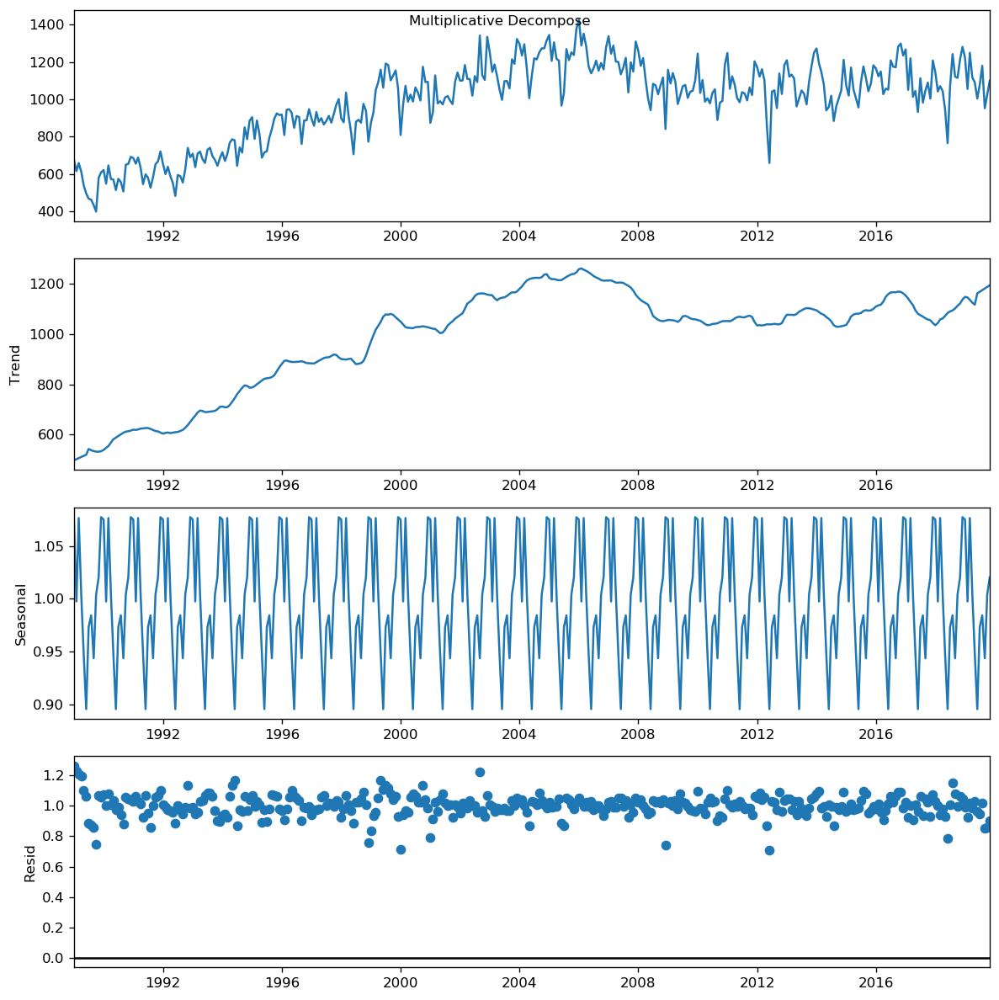

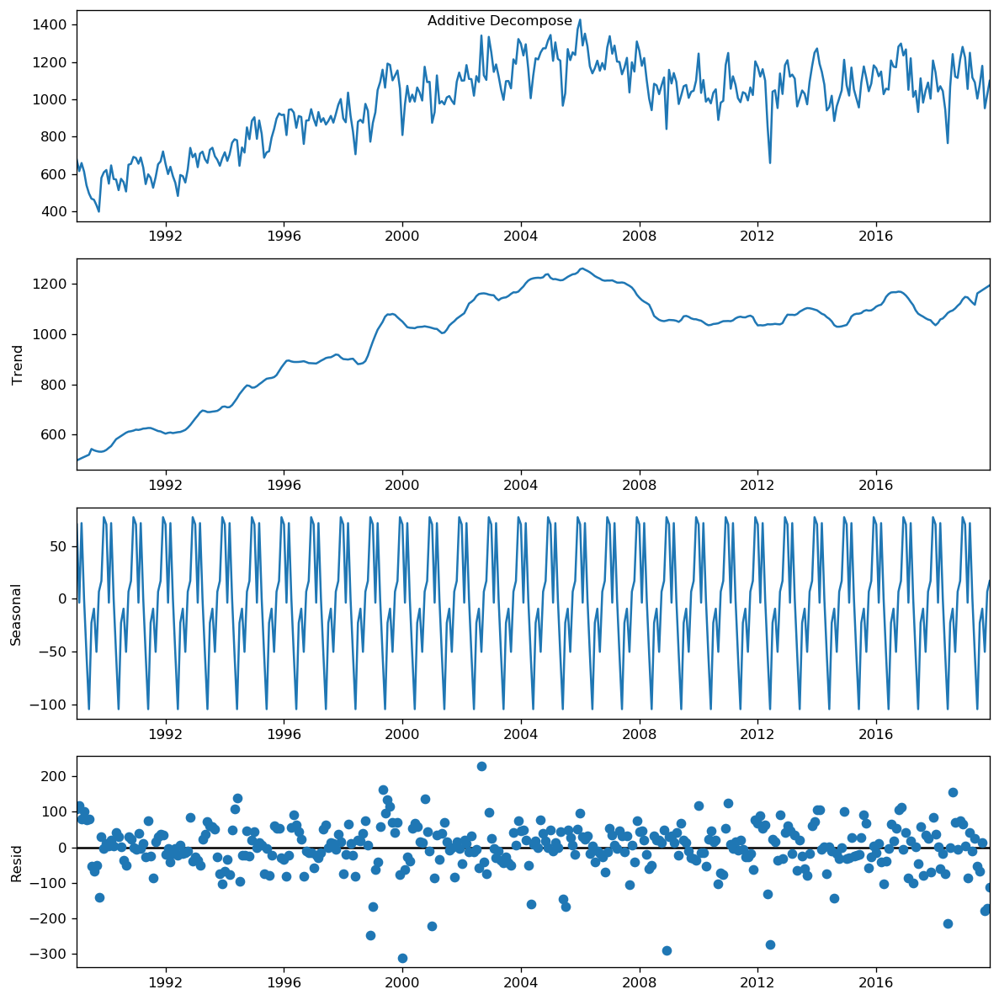

In [38]:
# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=10)
result_add.plot().suptitle('Additive Decompose', fontsize=10)
plt.show()

In [39]:
df_reconstructed = pd.concat([result_mul.seasonal, result_mul.trend, result_mul.resid, result_mul.observed], axis=1)
df_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
df_reconstructed.head()

,seas,trend,resid,actual_values
REF_DATE,,,,
1989-01-01,1.075257,498.013442,1.262016,675.8
1989-02-01,0.997504,502.523203,1.227884,615.5
1989-03-01,1.076703,507.032964,1.206395,658.6
1989-04-01,1.004071,511.542725,1.193283,612.9
1989-05-01,0.947876,516.052486,1.103539,539.8


In [40]:
#def fit_func(x,a,b):
#    return a*pow(x,0.5)+b

In [41]:
y_value = Value_AB.VALUE

In [42]:
y_value

REF_DATE
1989-01-01     675.8
1989-02-01     615.5
1989-03-01     658.6
1989-04-01     612.9
1989-05-01     539.8
               ...  
2019-07-01    1078.2
2019-08-01    1179.3
2019-09-01     952.2
2019-10-01    1023.4
2019-11-01    1099.4
Name: VALUE, Length: 371, dtype: float64

In [43]:
#y_value.plot(figsize=(15, 6))
#plt.show()

## Find if the time series is stationary or non-stationary

- Before we make a model we must ensure that the time series is stationary. 


- A **stationary (time) series** is one whose shift in time does not cause change in shape of the distribution, in other worrds  statistical properties such as the **mean, variance and autocorrelation are all constant over time**.


- Non-stationary data should be first converted into stationary data, this can be done by removing trend etc.,  so that further statistical analysis can be done on the de-trended stationary data.

- There are two ways to determine if a time series is stationary or not. 

- **Rolling Statistics**: Plot the rolling mean and rolling standard deviation. The time series is stationary if they remain constant with time (We can simply have a look with the naked eye to see if the lines are straight and parallel to the x-axis).


- **Augmented Dickey-Fuller Test**: The time series is considered stationary if the p-value is low (according to the null hypothesis) and the critical values at 1%, 5%, 10% confidence intervals are as close as possible to the ADF Statistics

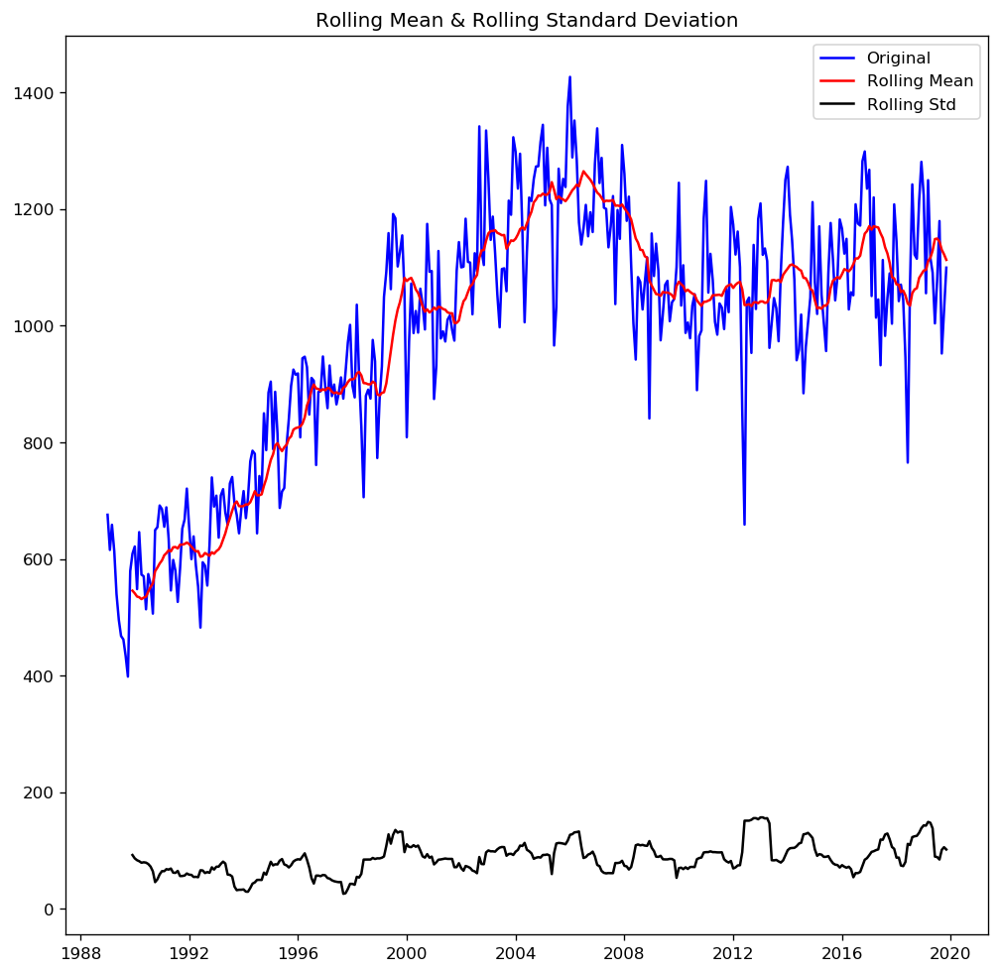

In [44]:
rolling_mean = Value_AB.rolling(window = 12).mean()
rolling_std = Value_AB.rolling(window = 12).std()
plt.plot(Value_AB, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

- We see from the plot that the rolling mean changes with time. Therefore the time series is not stationary.  

In [45]:
result = adfuller(Value_AB['VALUE'])
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))


ADF Statistic: -2.433106983219368
p-value: 0.1326093644089686
Critical Values:
	1%: -3.44880082033912
	5%: -2.869670179576637
	10%: -2.5711012838861036


- We see that the ADF Statistic is far  from the critical values and the p-value is greater than the threshold (0.05). Therefore, the time series is not stationary.

##  Estimate and eliminate the trend

- We see that there is a significant positive trend. So we can apply transformation.


- This can be done by taking a log, square root, cube root, etc

-  We can take log of the y-value to lower the rate at which rolling mean increases

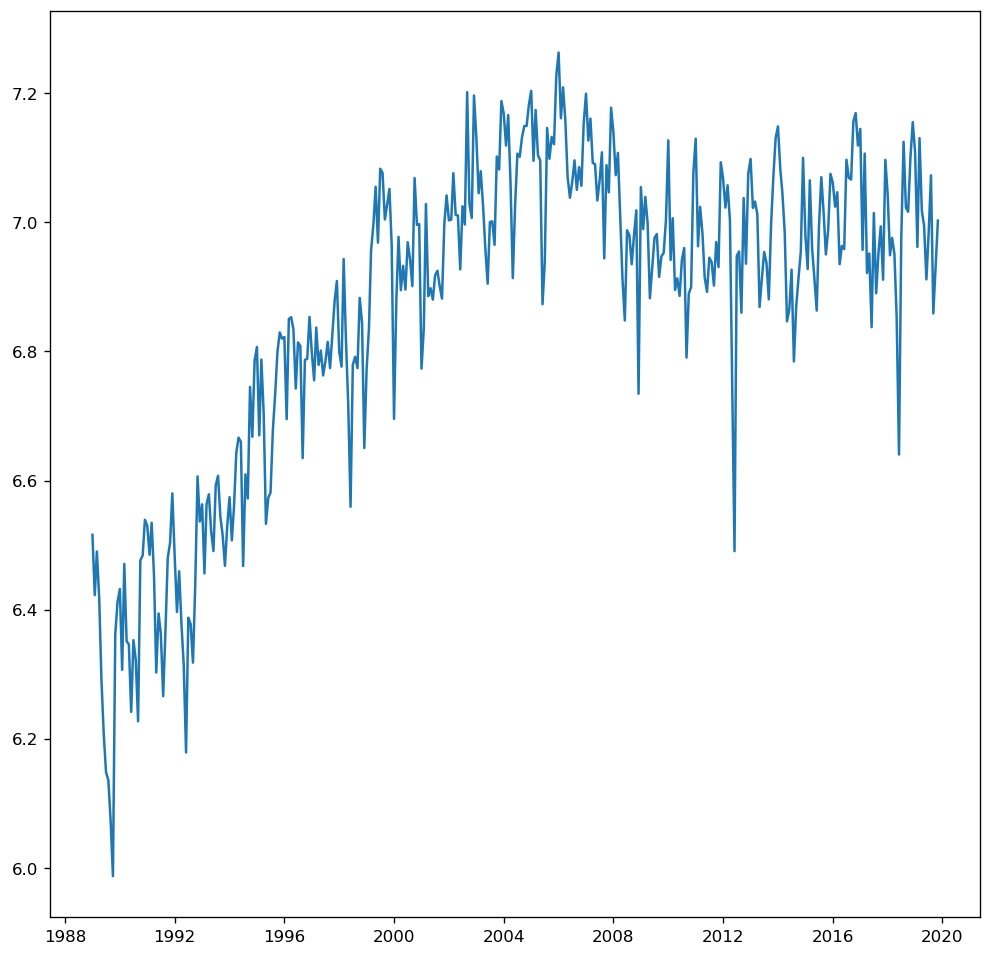

In [46]:
Value_AB_log = np.log(Value_AB)
plt.plot(Value_AB_log)

- We can also define a function  to run the  two test that determines if a time series is stationary or not 

In [47]:
def dilli_stationarity(timeseries):
    
    # rolling statistics
    rolling_mean = timeseries.rolling(window=12).mean()
    rolling_std = timeseries.rolling(window=12).std()
    
    # rolling statistics plot
    original = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(rolling_mean, color='red', label='Rolling Mean')
    std = plt.plot(rolling_std, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Dickey–Fuller test:
    result = adfuller(timeseries['VALUE'])
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

- There are various methods that can be applied to transform  non stationary time series to stationary. 

### Method 1: We subtract the rolling mean from the log plot

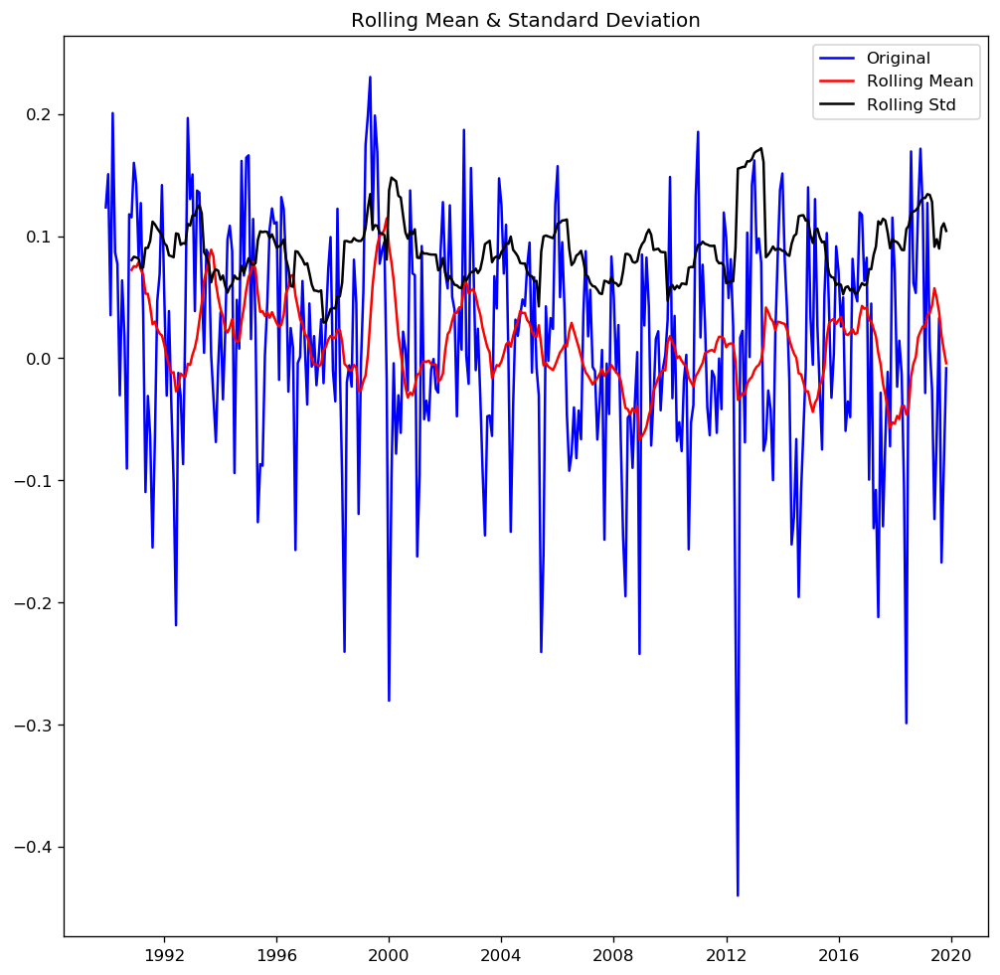

ADF Statistic: -5.628320465575721
p-value: 1.1042187125793575e-06
Critical Values:
	1%: -3.4493918438232525
	5%: -2.8699298018856574
	10%: -2.5712397066390458


In [48]:
rolling_mean = Value_AB_log.rolling(window=12).mean()
Value_AB_log_minus_mean = Value_AB_log - rolling_mean
Value_AB_log_minus_mean.dropna(inplace=True)
dilli_stationarity(Value_AB_log_minus_mean)

- We see from the plot that the rolling mean and standard deviation are approximately parallel but the p -value is stil far off from threshold. 

 ## Method 2: We apply exponential decay

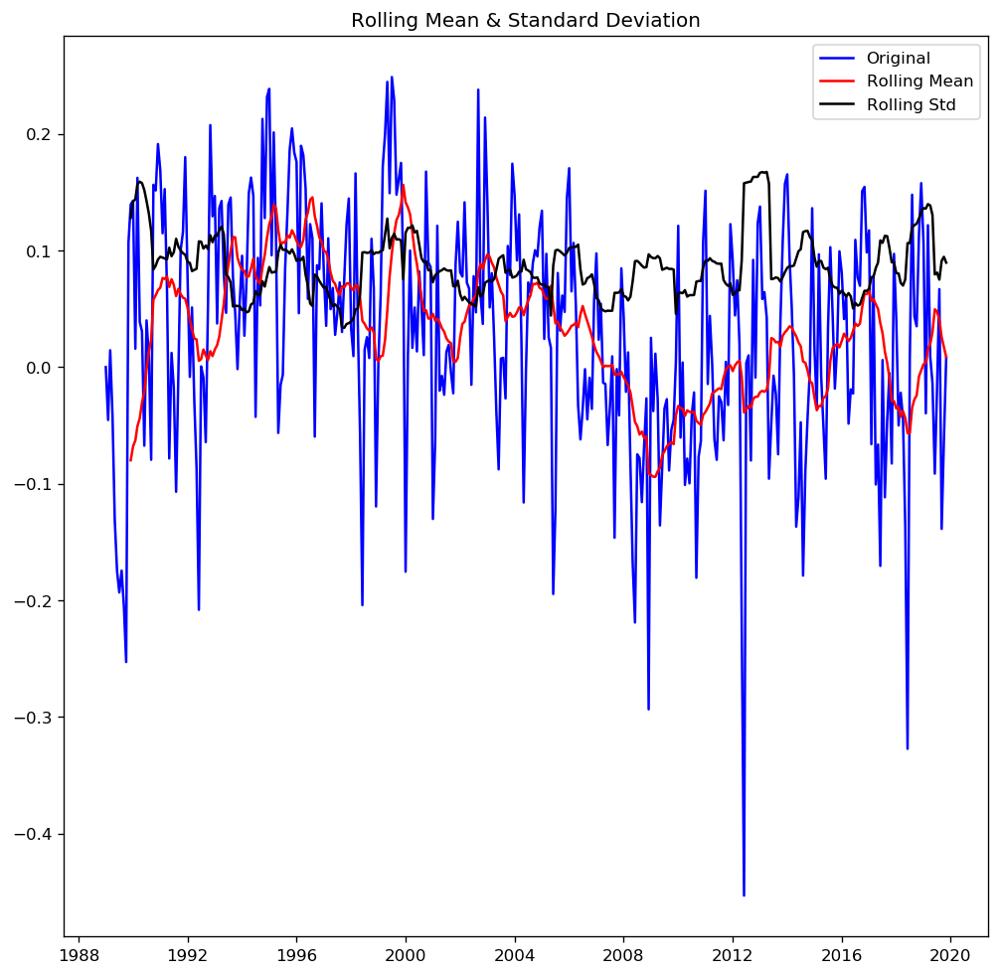

ADF Statistic: -3.2827693712854704
p-value: 0.015666473637970524
Critical Values:
	1%: -3.44880082033912
	5%: -2.869670179576637
	10%: -2.5711012838861036


In [49]:
rolling_mean_exp_decay = Value_AB_log.ewm(halflife=12, min_periods=0, adjust=True).mean()
Value_AB_log_exp_decay = Value_AB_log - rolling_mean_exp_decay
Value_AB_log_exp_decay.dropna(inplace=True)
dilli_stationarity(Value_AB_log_exp_decay)

- Altough the p-value is below the treshold, exponential method is also not stationary as there is still a change in shape over time.   

## Method 3: Apply time shift, i.e. subtract point by the one that preceded it. 

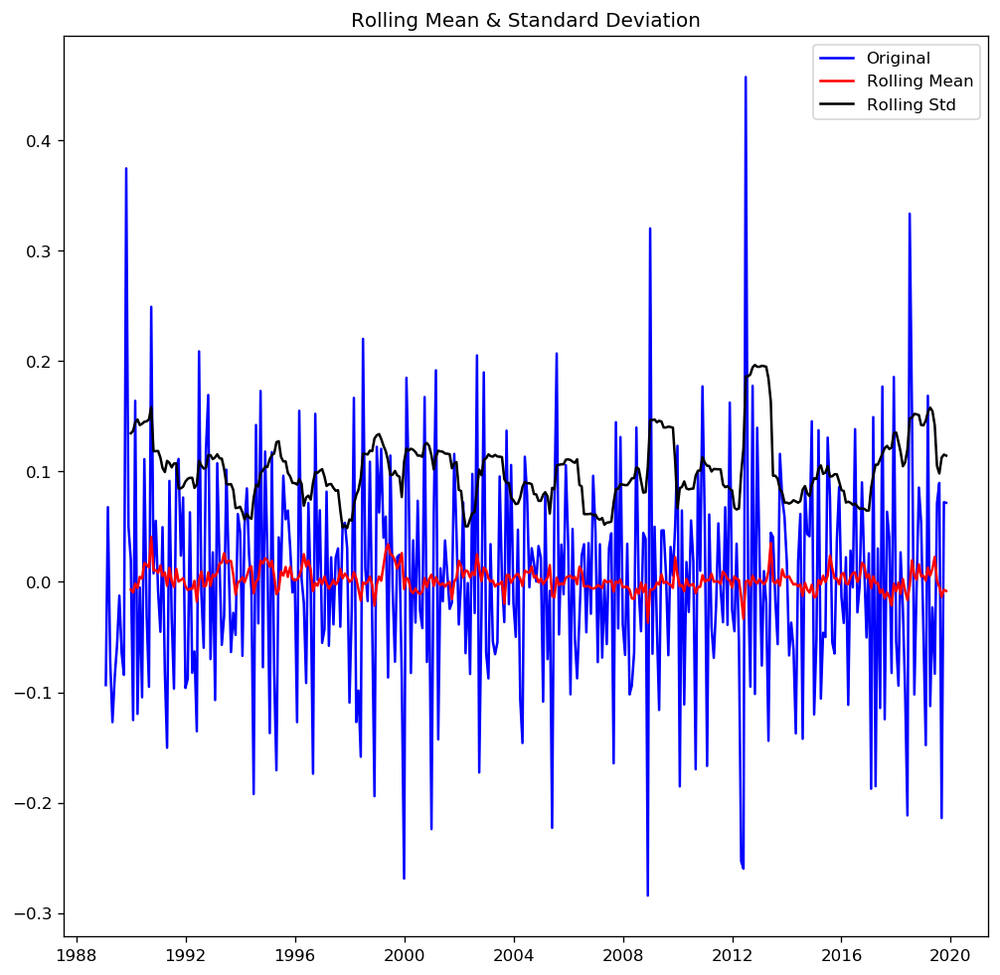

ADF Statistic: -7.416584301716043
p-value: 6.909831968781868e-11
Critical Values:
	1%: -3.44880082033912
	5%: -2.869670179576637
	10%: -2.5711012838861036


In [50]:
Value_AB_log_shift = Value_AB_log - Value_AB_log.shift()
Value_AB_log_shift.dropna(inplace=True)
dilli_stationarity(Value_AB_log_shift)

- Time shifting performed better than the first two methods, p-value is also below the threshold. 

### Differencing

- We take the difference of the observation at a particular instant with that at the previous instant. This mostly works well in improving stationarity.

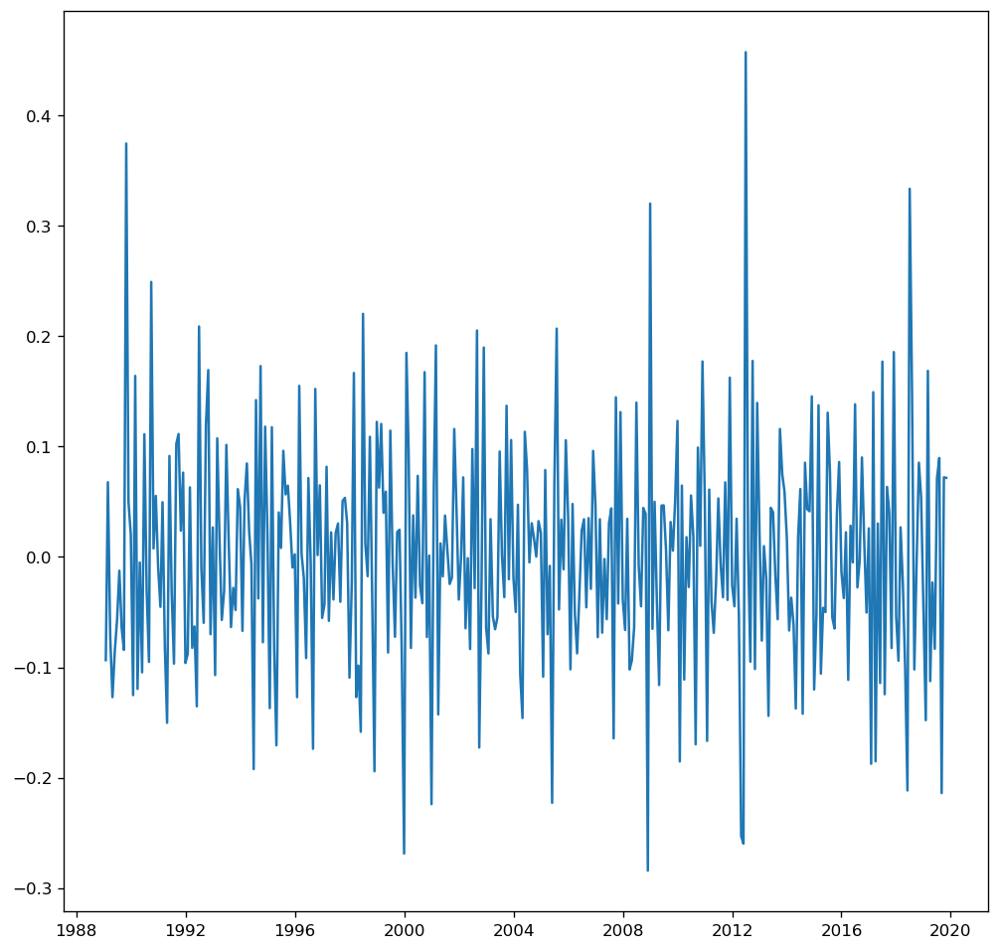

In [51]:
Value_AB_log_diff = Value_AB_log - Value_AB_log.shift()
plt.plot(Value_AB_log_diff)

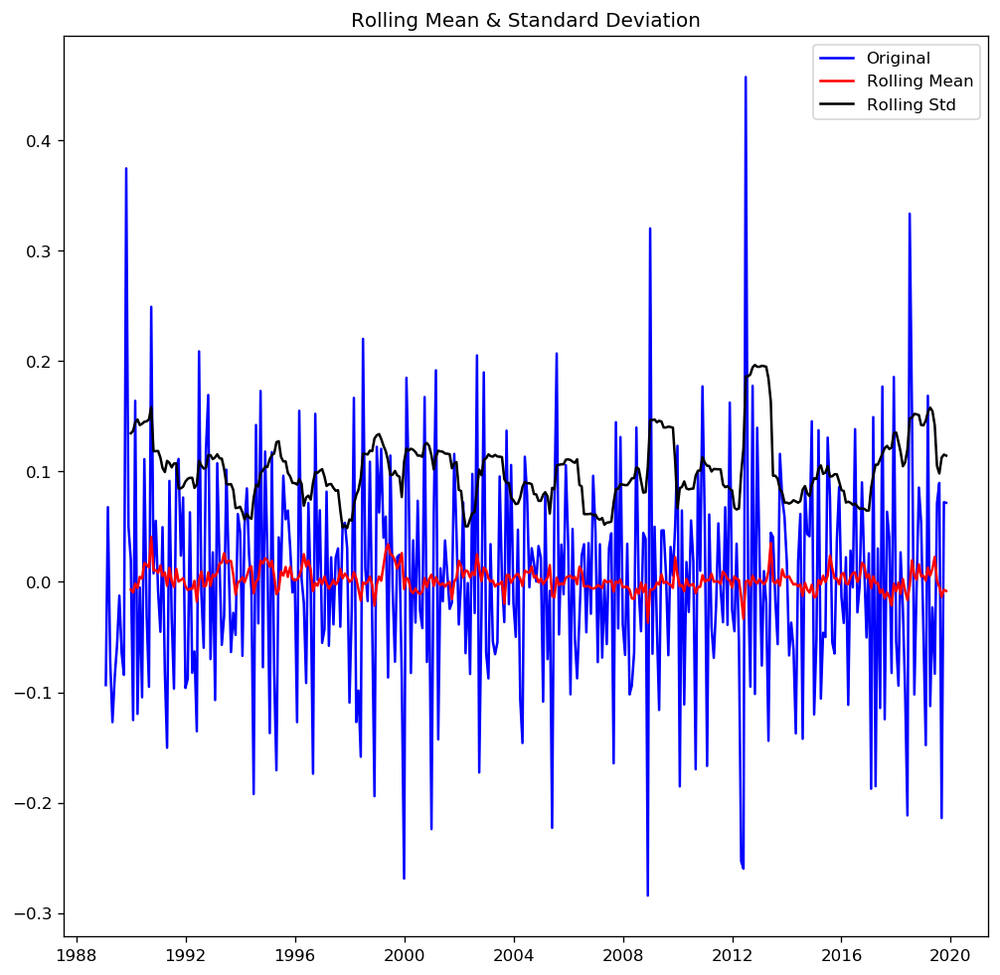

ADF Statistic: -7.416584301716043
p-value: 6.909831968781868e-11
Critical Values:
	1%: -3.44880082033912
	5%: -2.869670179576637
	10%: -2.5711012838861036


In [52]:
Value_AB_log_diff.dropna(inplace=True)
dilli_stationarity(Value_AB_log_diff)

## Decomposition

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



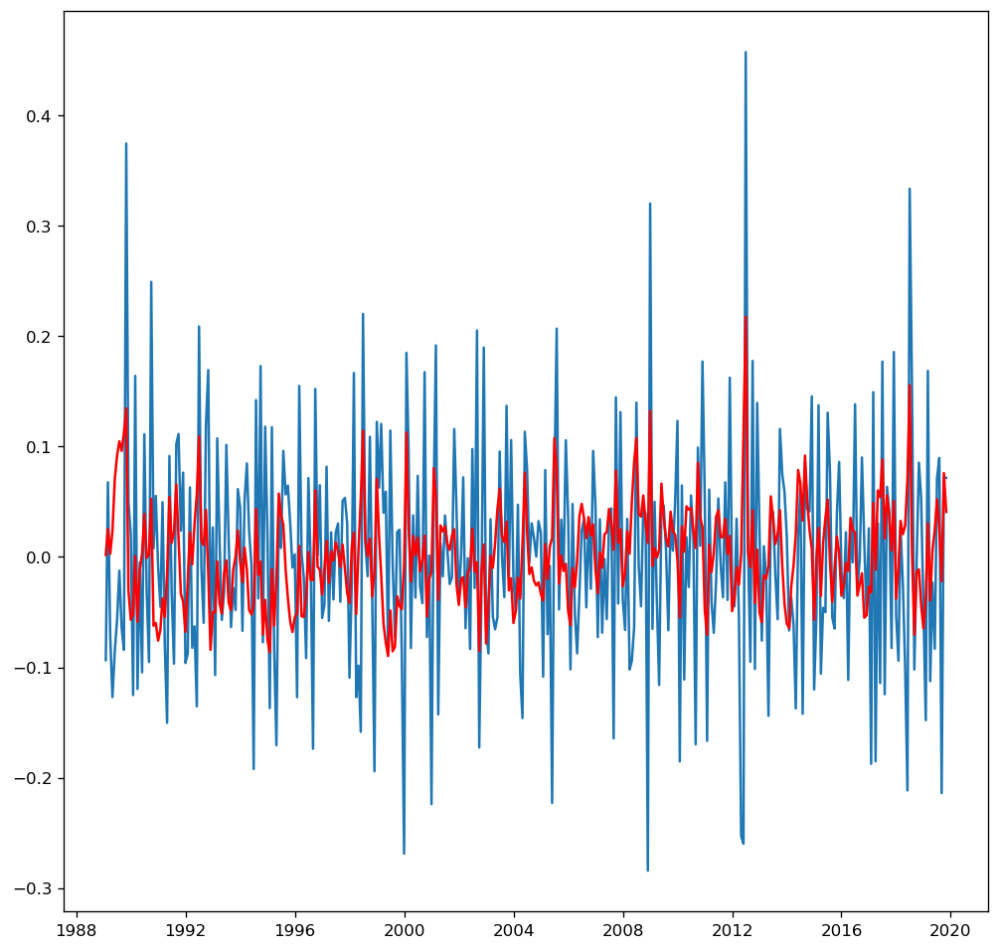

In [53]:
decomposition = seasonal_decompose(Value_AB_log) 
model = ARIMA(Value_AB_log, order=(2,1,2))
results = model.fit(disp=-1)
plt.plot(Value_AB_log_shift)
plt.plot(results.fittedvalues, color='red')

In [54]:
#predictions_ARIMA_diff = pd.Series(results.fittedvalues, copy=True)
#predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
#predictions_ARIMA_log = pd.Series(Value_AB_log['VALUE'].iloc[1], index=Value_AB_log.index)
#predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum, fill_value=0)
#predictions_ARIMA = np.exp(predictions_ARIMA_log)
#plt.plot(Value_AB)
#plt.plot(predictions_ARIMA)


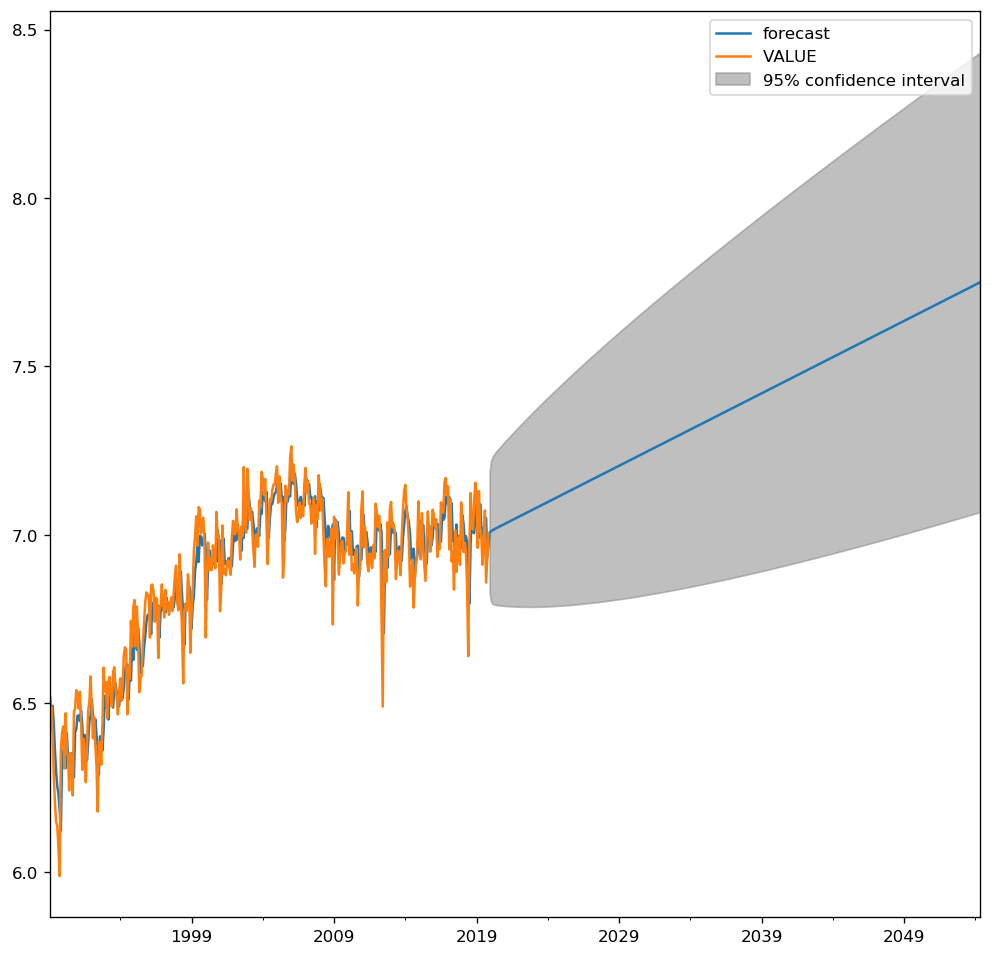

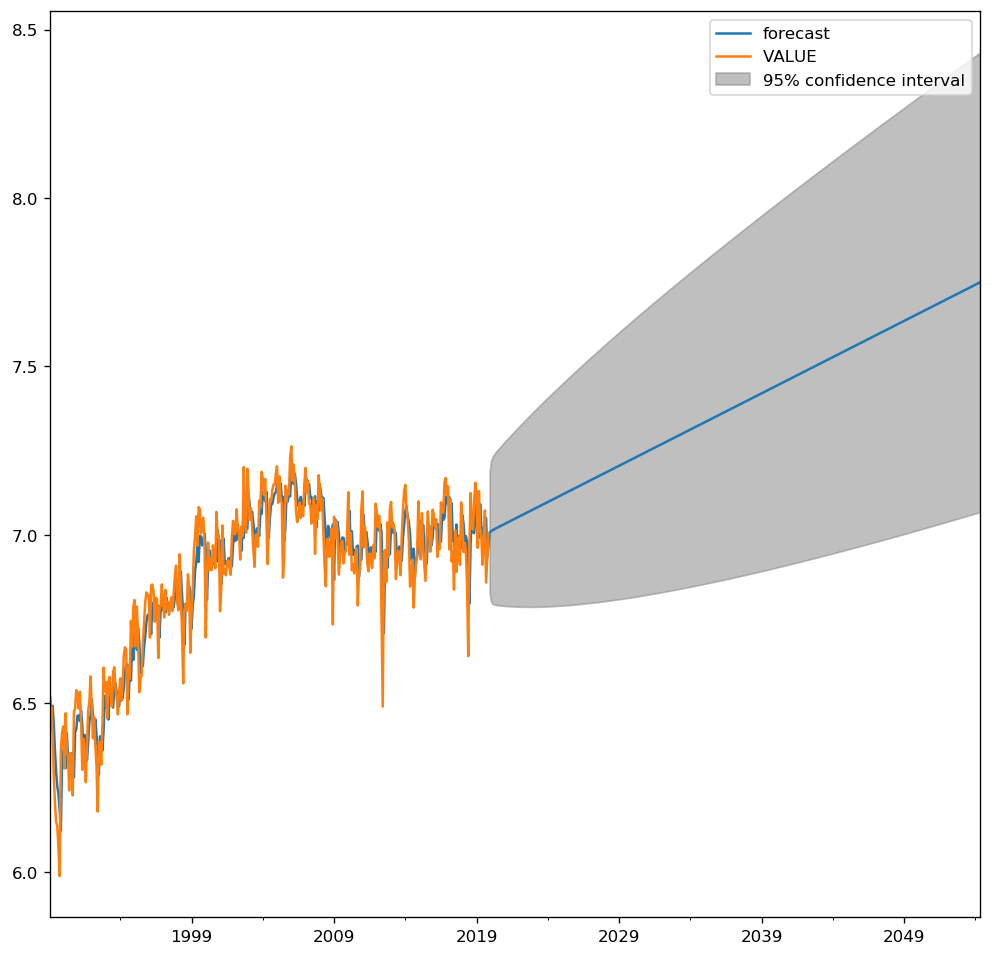

In [55]:
results.plot_predict(1,784)

In [56]:
from statsmodels.tsa.stattools import acf, pacf

In [57]:
lag_acf = acf(Value_AB_log_diff, nlags=20)
lag_pacf = pacf(Value_AB_log_diff, nlags=20, method='ols')

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning:

fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.



### Autocorrelation Function (ACF)

- Correlation between the Time Series with a lagged version of itself

Text(0.5, 1.0, 'Autocorrelation Function')

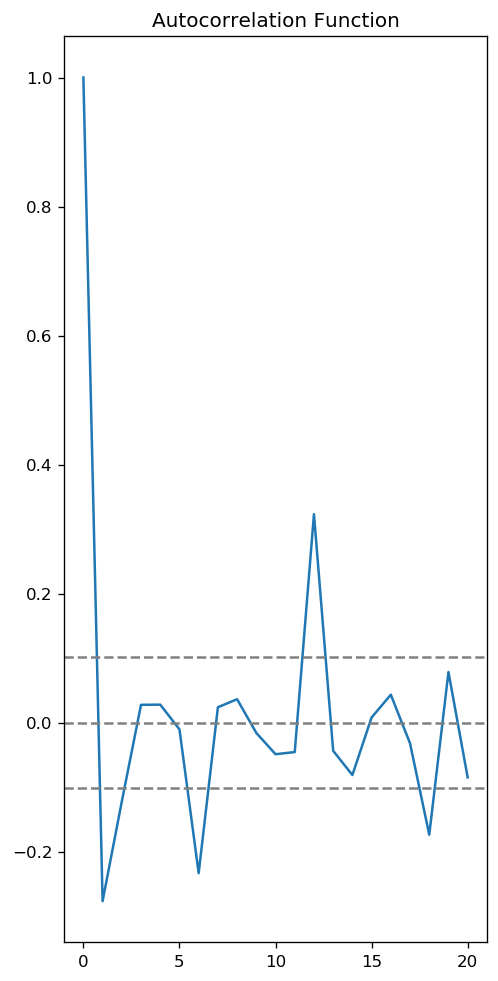

In [58]:
plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(Value_AB_log_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(Value_AB_log_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

### Partial Autocorrelation Function (PACF):

- Correlation between the Time Series with a lagged version of itself but after eliminating the variations

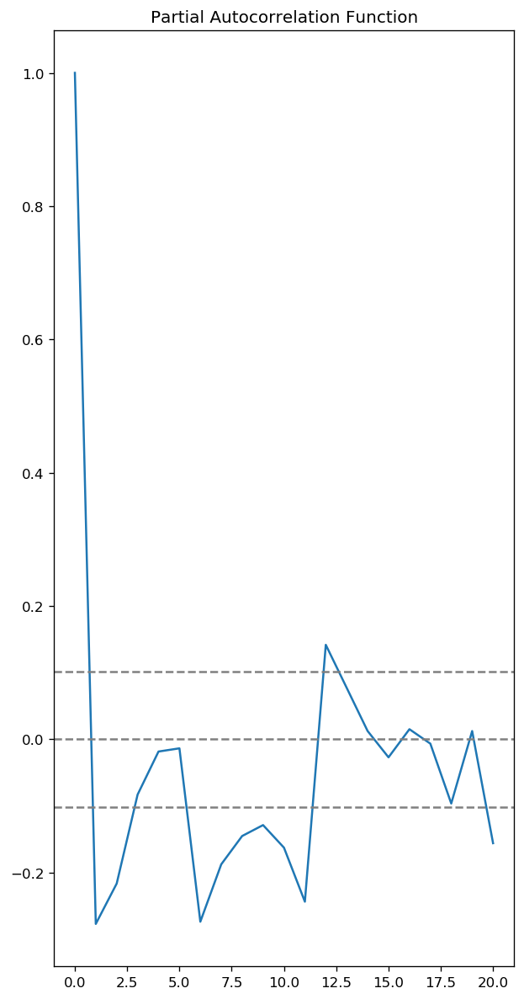

In [59]:
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(Value_AB_log_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(Value_AB_log_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

- Three diff ARIMA Model Predictions including individual as well as combined  

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



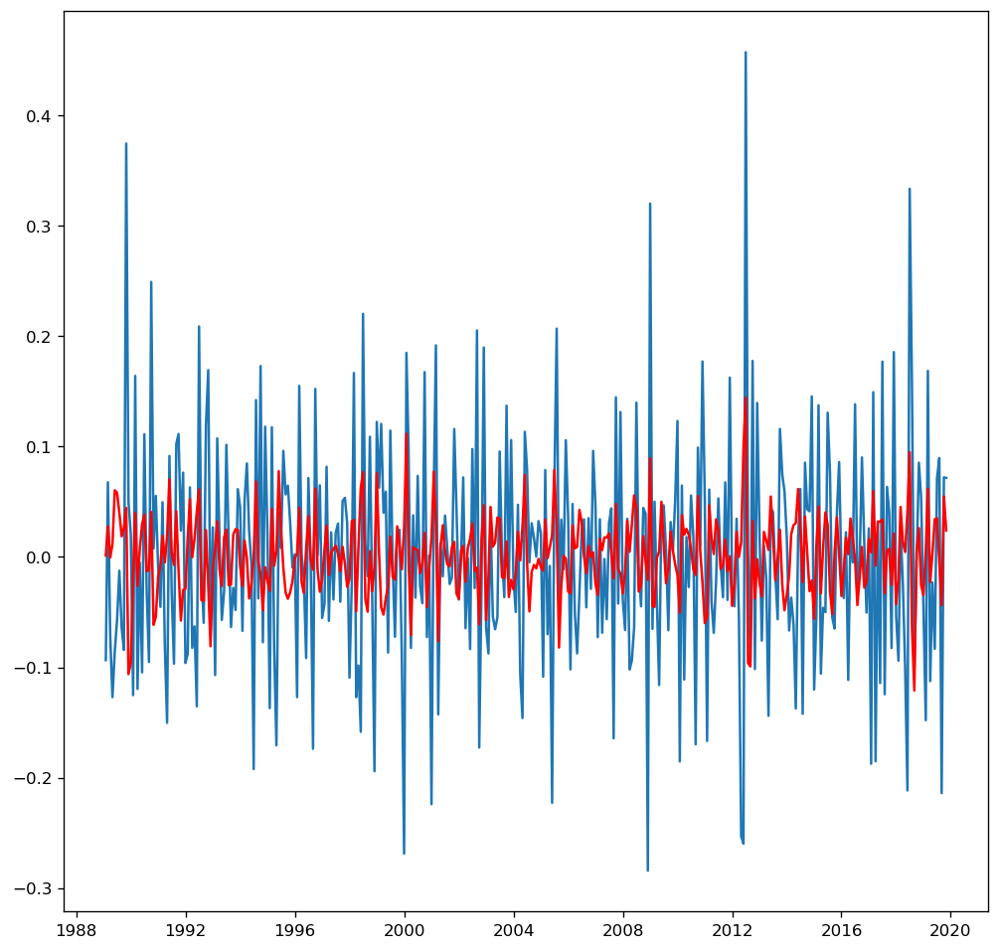

In [60]:
model = ARIMA(Value_AB_log, order=(2, 1, 0))  
results_AR = model.fit(disp=-1)  
plt.plot(Value_AB_log_diff)
plt.plot(results_AR.fittedvalues, color='red')


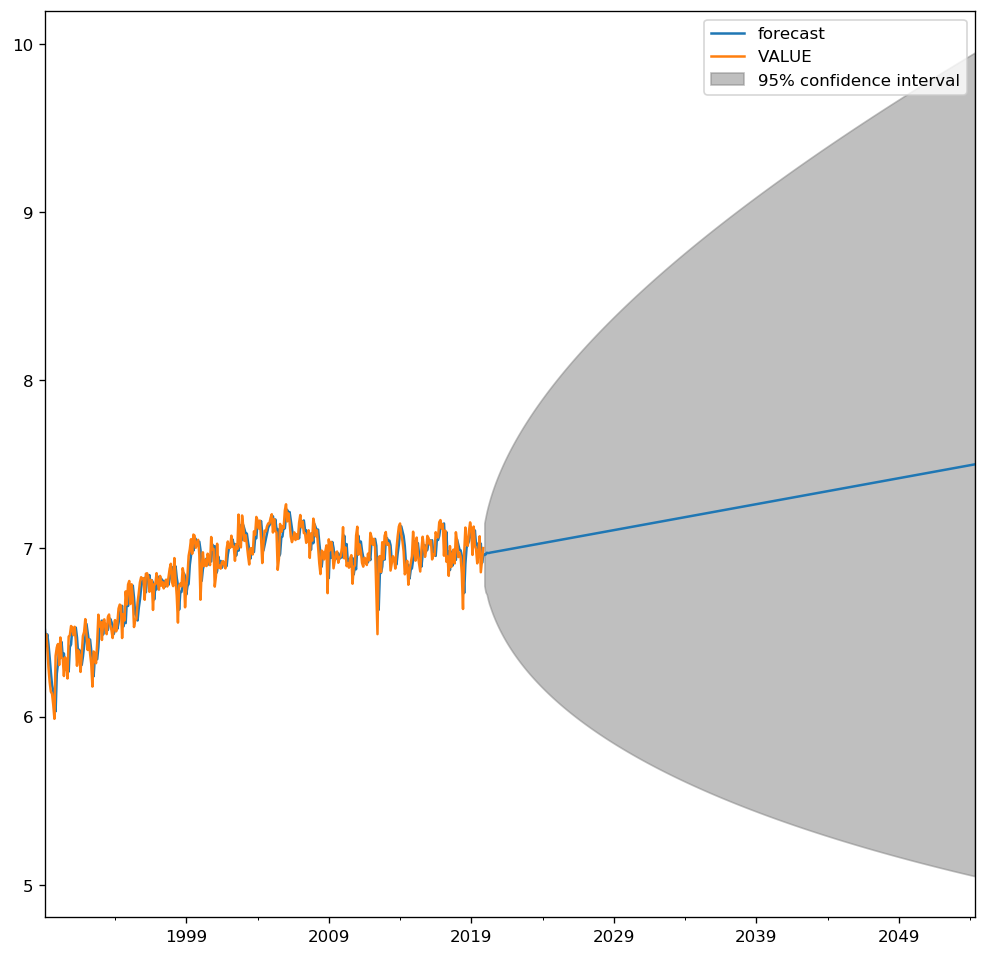

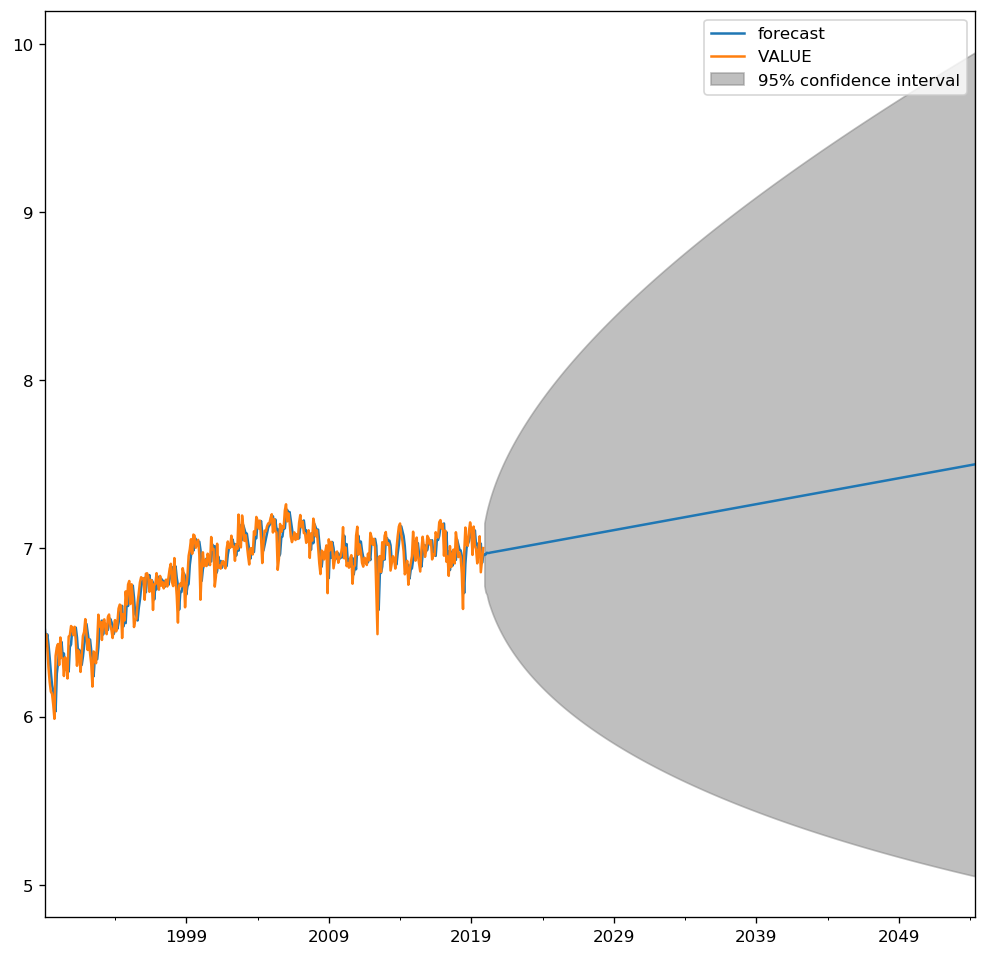

In [64]:
results_AR.plot_predict(1,784)

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



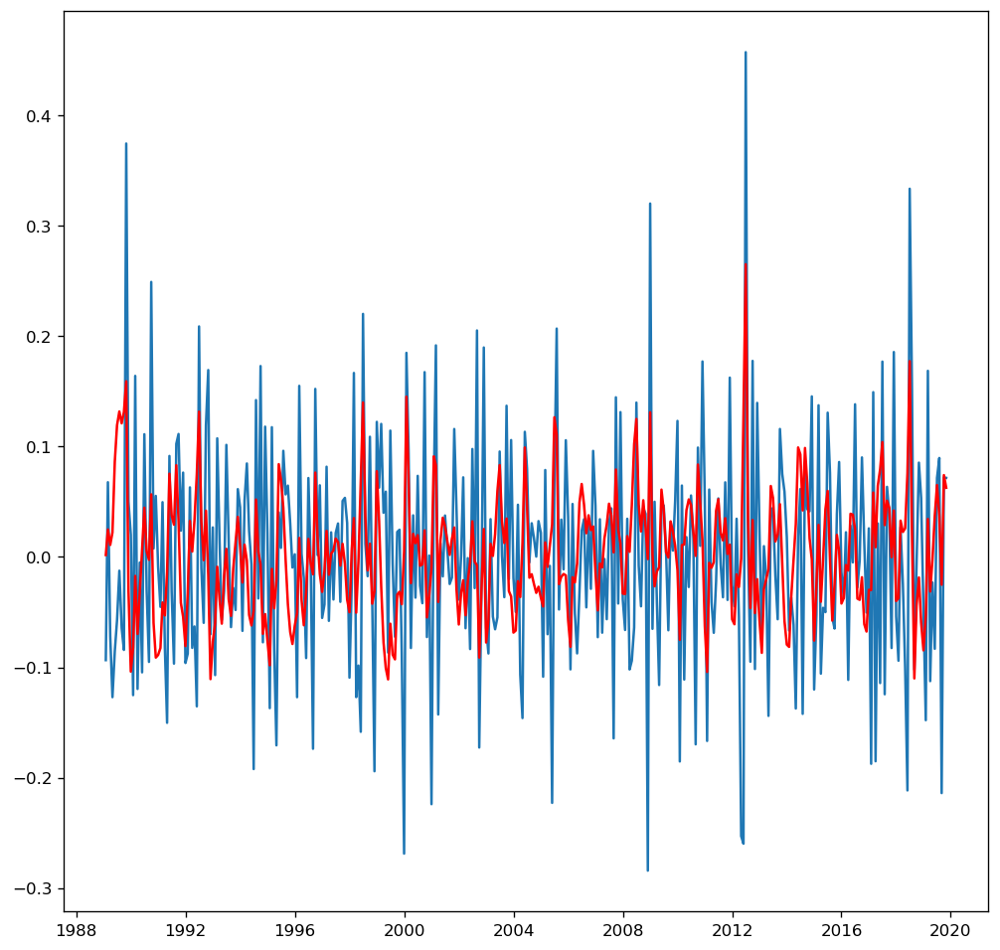

In [65]:
model = ARIMA(Value_AB_log, order=(0, 1, 2))  
results_MA = model.fit(disp=-1)  
plt.plot(Value_AB_log_diff)
plt.plot(results_MA.fittedvalues, color='red')

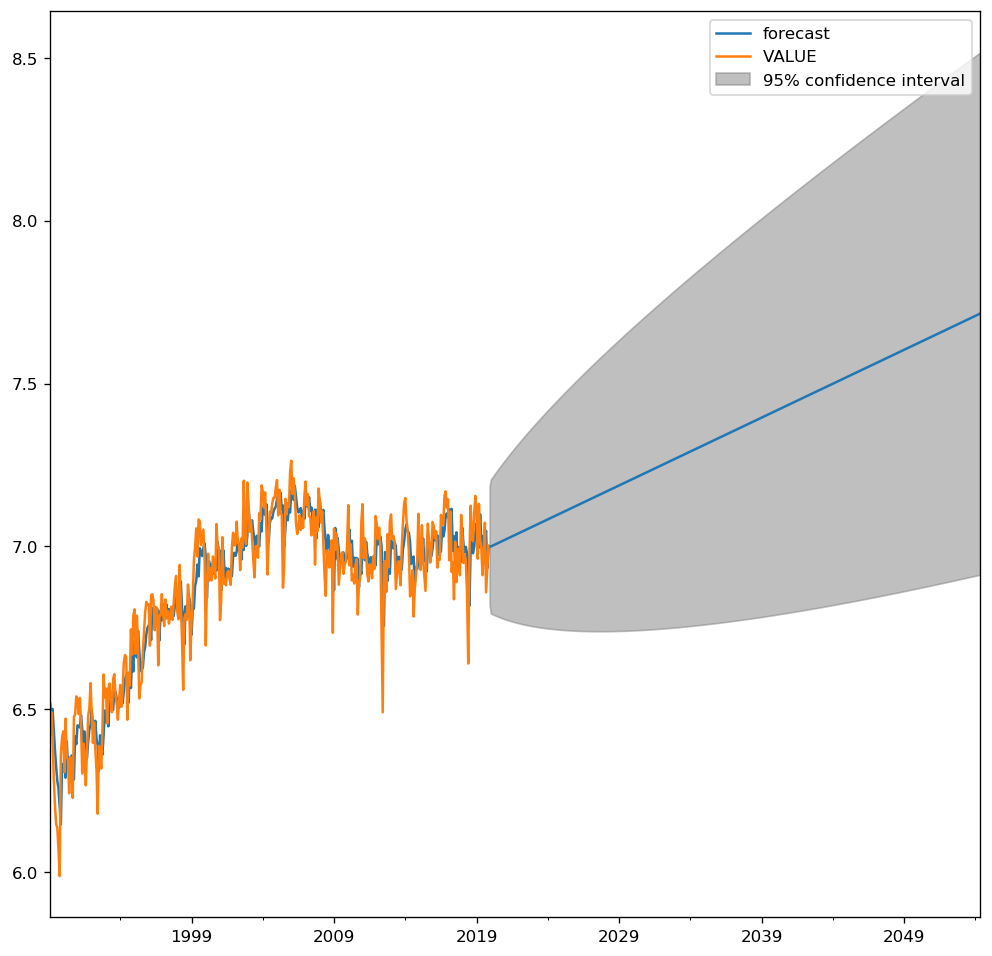

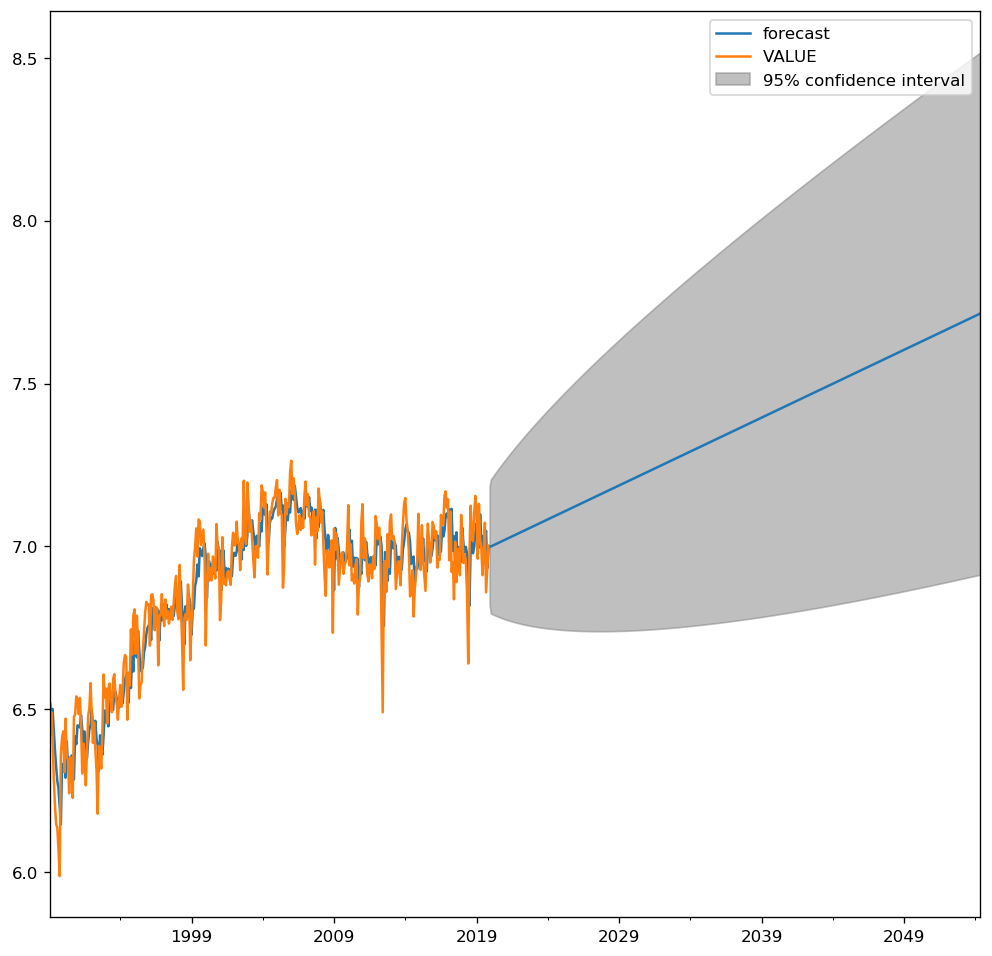

In [66]:
results_MA.plot_predict(1,784)

- Combined Model

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



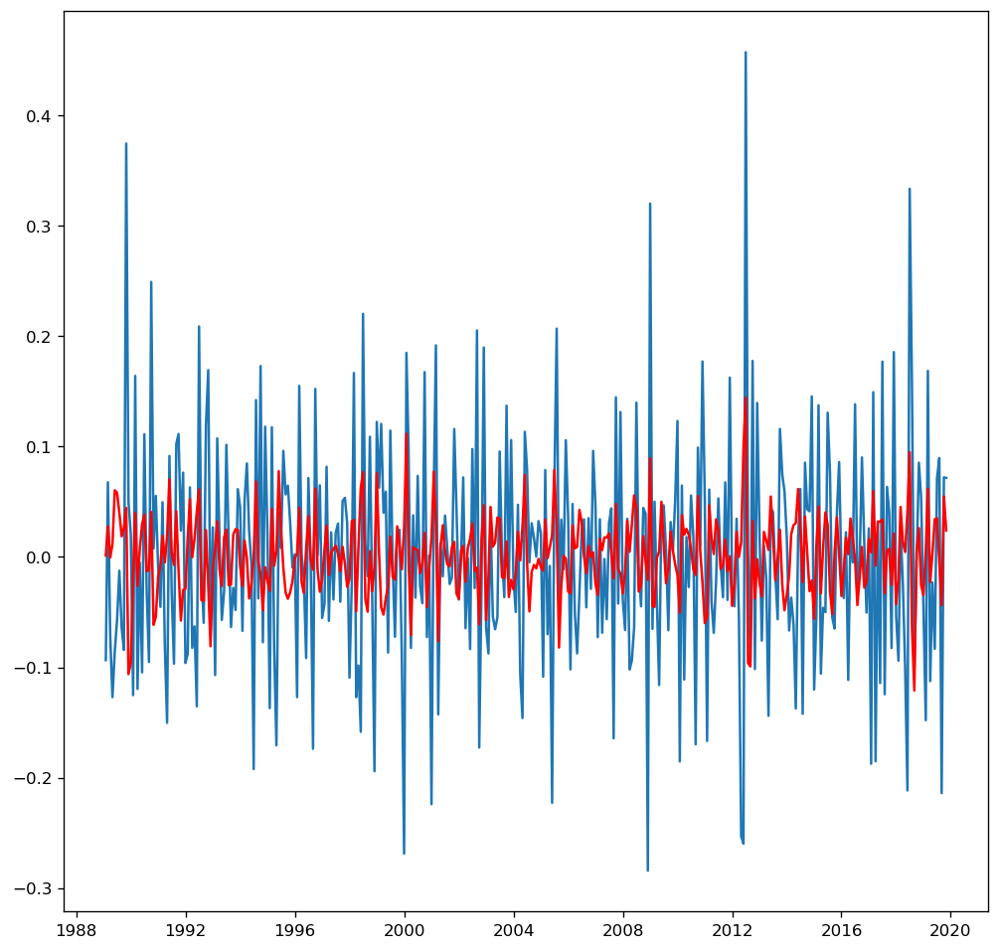

In [67]:
model = ARIMA(Value_AB_log, order=(2, 1, 0))  
results_ARIMA = model.fit(disp=-1)  
plt.plot(Value_AB_log_diff)
plt.plot(results_ARIMA.fittedvalues, color='red')

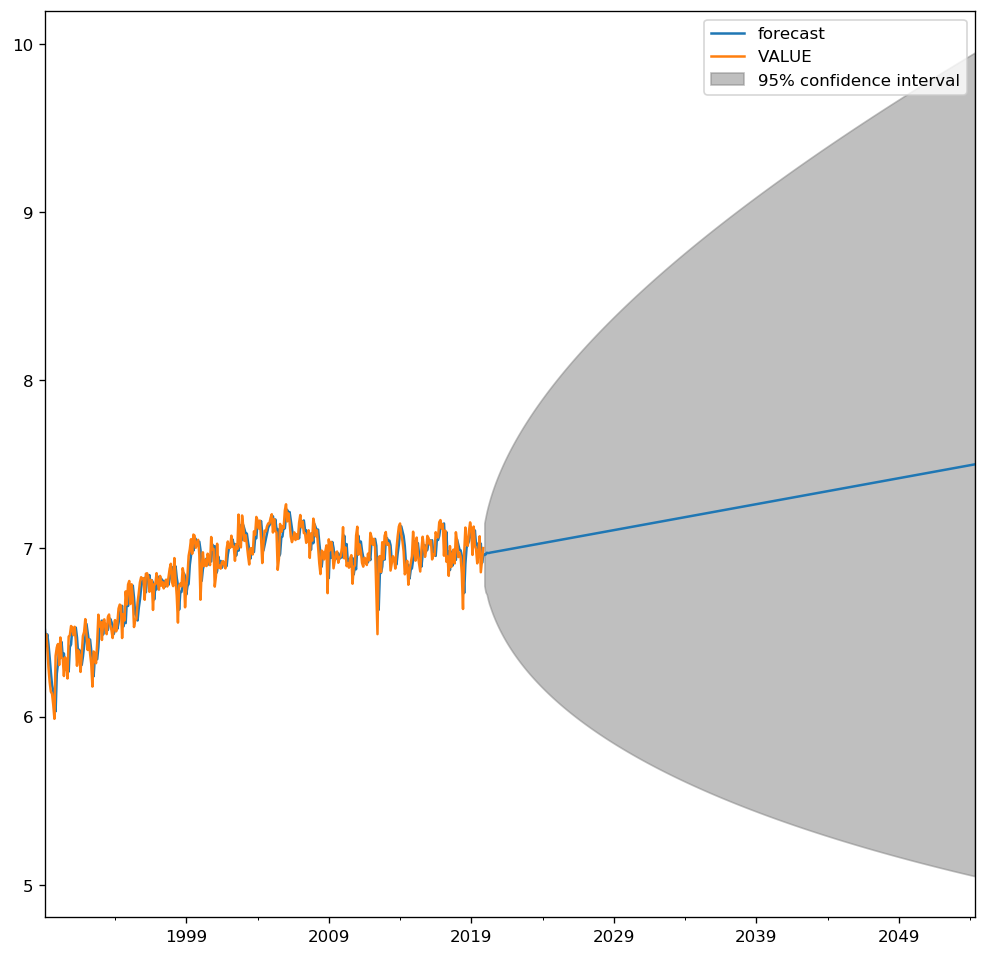

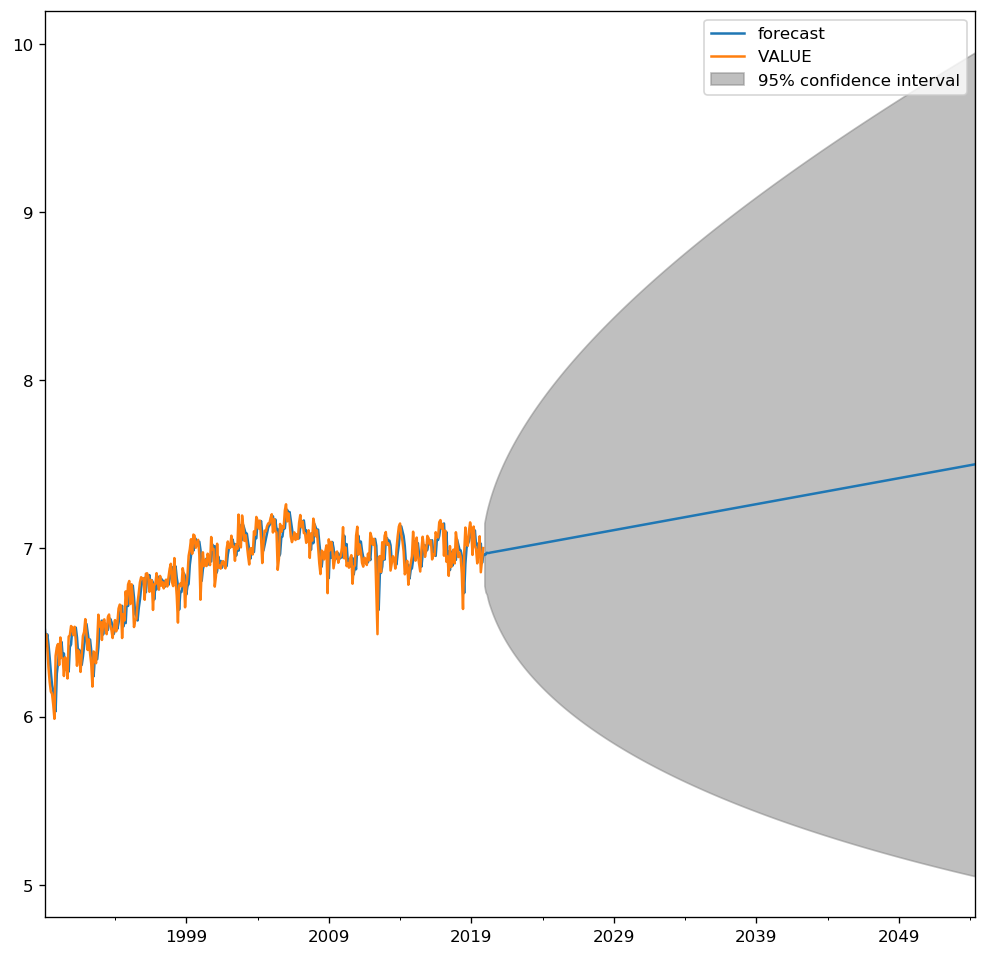

In [68]:
results_ARIMA.plot_predict(1,784)

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



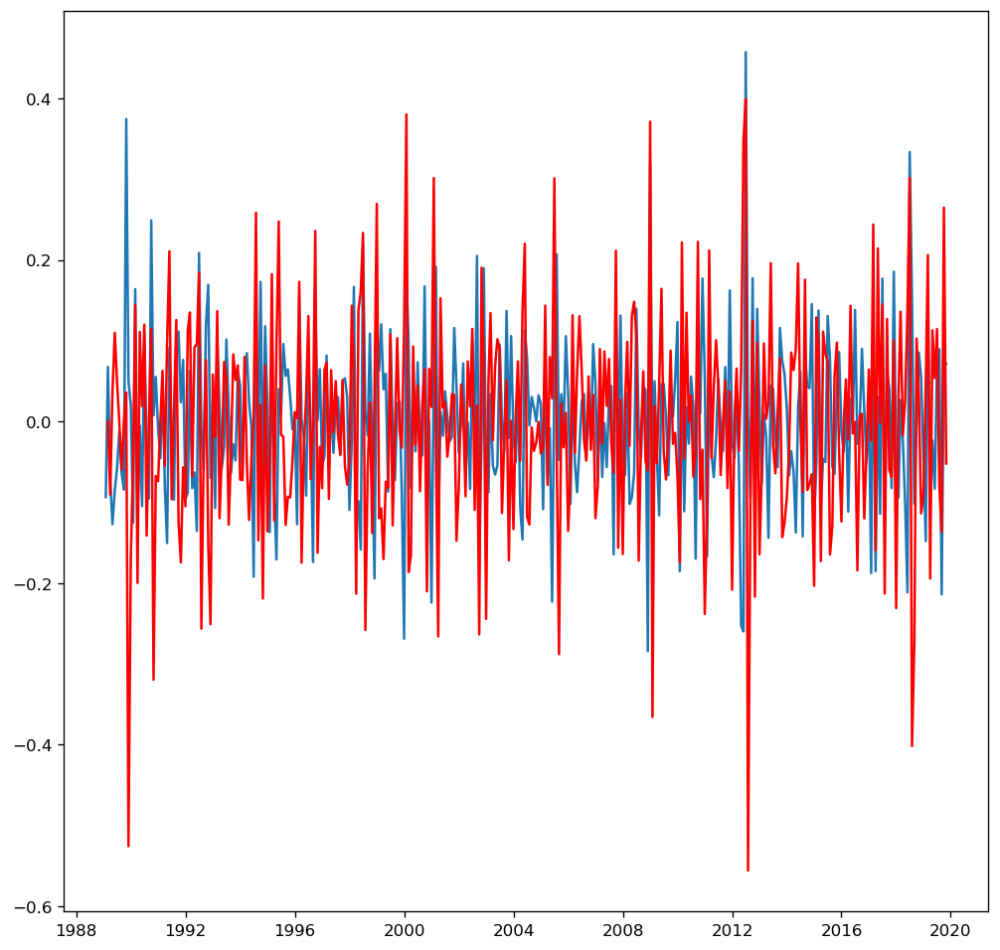

In [69]:
model = ARIMA(Value_AB_log, order=(2, 2, 1))  
results_ARIMA = model.fit(disp= 1)  
plt.plot(Value_AB_log_diff)
plt.plot(results_ARIMA.fittedvalues, color='red')

In [70]:
len(Value_AB)

371

In [71]:
#arima_pred = results_ARIMA.predict(Value_AB['VALUE'].index[300], Value_AB['VALUE'].index[-1], typ="levels")

In [72]:
#plt.plot(Value_AB.VALUE[200:], label='Original')
#plt.plot(arima_pred, label='Prediction')
#plt.legend(loc=1)
#plt.title('RMSE: %.4f'% np.sqrt(sum((arima_pred_recent-Value_AB.VALUE[300:])**2)/len(Value_AB.VALUE[300:])))


# Auto ARIMA Model

In [73]:
from pmdarima.arima import auto_arima

- Akaike information criterion (AIC) is an estimator of the relative quality of statistical models for a given set of data. Given a collection of models for the data, AIC estimates the quality of each model, relative to each of the other models.
- Performing stepwise search to minimize AIC

In [ ]:
stepwise_model = auto_arima(Value_AB, start_p=1, start_q=1,
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=1, D=1, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)
print(stepwise_model.aic())

Performing stepwise search to minimize aic
Fit ARIMA: (1, 1, 1)x(0, 1, 1, 12) (constant=True); AIC=4121.995, BIC=4141.397, Time=3.713 seconds
Fit ARIMA: (0, 1, 0)x(0, 1, 0, 12) (constant=True); AIC=4371.510, BIC=4379.271, Time=0.051 seconds
Fit ARIMA: (1, 1, 0)x(1, 1, 0, 12) (constant=True); AIC=4242.640, BIC=4258.162, Time=0.964 seconds
Fit ARIMA: (0, 1, 1)x(0, 1, 1, 12) (constant=True); AIC=4136.709, BIC=4152.231, Time=1.504 seconds
Fit ARIMA: (0, 1, 0)x(0, 1, 0, 12) (constant=False); AIC=4369.511, BIC=4373.391, Time=0.034 seconds
Fit ARIMA: (1, 1, 1)x(0, 1, 0, 12) (constant=True); AIC=4276.814, BIC=4292.336, Time=0.779 seconds
Near non-invertible roots for order (1, 1, 1)(0, 1, 0, 12); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(1, 1, 1, 12) (constant=True); AIC=4122.541, BIC=4145.825, Time=5.422 seconds
Near non-invertible roots for order (1, 1, 1)(1, 1, 1, 12); setting score to inf (at least one inverse r

## Train and Test Data 

- In this,  we basically chop off a portion of our latest data and use that as a test set.
- Then we will train on the rest of the data and forecast into the future.
- We then compare our forecast with the section of data we chopped off.

In [ ]:
train = Value_AB.loc['1999-01-01':'2015-12-01']


In [ ]:
train

In [ ]:
train.head()

In [ ]:
train.tail()

In [ ]:
#test

In [ ]:
#test.head()

In [184]:
#test.tail()

In [185]:
#len(test)

- Train the stepwise model by passing the training data.

In [ ]:
stepwise_model.fit(train)

- Forecast into the future

In [ ]:
future_forecast = stepwise_model.predict(n_periods=35)

In [ ]:
future_forecast

- Lets see how well our prediction forecast matched up with the test set.

In [ ]:
future_forecast = pd.DataFrame(future_forecast,index = test.index,columns=['VALUE'])
pd.concat([test,future_forecast],axis=1).plot()

In [ ]:
pd.concat([Value_AB,future_forecast],axis=1).plot()